<a href="https://colab.research.google.com/github/Hailemicael/Cardiovascular_Disease_Prediction_with_Explainable_AI/blob/master/Cardiovascular_Disease_Prediction_with_Explainable_AI_Last.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Data Preparation and Loading**

### **Libraries**

In [ ]:
!pip install shap

In [ ]:
!pip install lime

In [ ]:
import os  # Provides functions for interacting with the operating system
import shap
import lime
import itertools
import numpy as np
import pandas as pd  # Data manipulation and analysis
import seaborn as sns   # This is used for data visualization
import lime.lime_tabular
import tensorflow as tf  # Deep learning framework
from sklearn.svm import SVC # Support Vector Machine model for classification tasks
import scipy.stats as stats
from collections import Counter
import matplotlib.pyplot as plt  # Plotting and visualizations
from imblearn.over_sampling import SMOTE  # Handles imbalanced datasets with oversampling
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split  # Splits data into training and test sets
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.layers import Conv1D, MaxPool1D, Flatten, Dense, Dropout, BatchNormalization
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix  # Evaluation metrics for classification models

### **Loading the Dataset and Getting Information about the Dataset**

In [ ]:
df = pd.read_csv('/content/heart_failure.csv') #Used for reading the dataframe
df.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [ ]:
df.info()      #Getting the info of the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [ ]:
print(f"Dataset shape: {df.shape}")  # Checking the Dataset Shape

### **Data Preprocessing**

In [ ]:
# Check for missing values
print("Missing values:")
print(df.isnull().sum())

# Check for duplicates
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

# Remove duplicates if any
df = df.drop_duplicates()

Missing values:
age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64
Number of duplicate rows: 0


In [ ]:
df.describe().T         #Used for understanding the spread in the data

,count,mean,std,min,25%,50%,75%,max
age,299.0,60.833893,11.894809,40.0,51.0,60.0,70.0,95.0
anaemia,299.0,0.431438,0.496107,0.0,0.0,0.0,1.0,1.0
creatinine_phosphokinase,299.0,581.839465,970.287881,23.0,116.5,250.0,582.0,7861.0
diabetes,299.0,0.418060,0.494067,0.0,0.0,0.0,1.0,1.0
ejection_fraction,299.0,38.083612,11.834841,14.0,30.0,38.0,45.0,80.0
high_blood_pressure,299.0,0.351171,0.478136,0.0,0.0,0.0,1.0,1.0
platelets,299.0,263358.029264,97804.236869,25100.0,212500.0,262000.0,303500.0,850000.0
serum_creatinine,299.0,1.393880,1.034510,0.5,0.9,1.1,1.4,9.4
serum_sodium,299.0,136.625418,4.412477,113.0,134.0,137.0,140.0,148.0
sex,299.0,0.648829,0.478136,0.0,0.0,1.0,1.0,1.0


<Axes: >

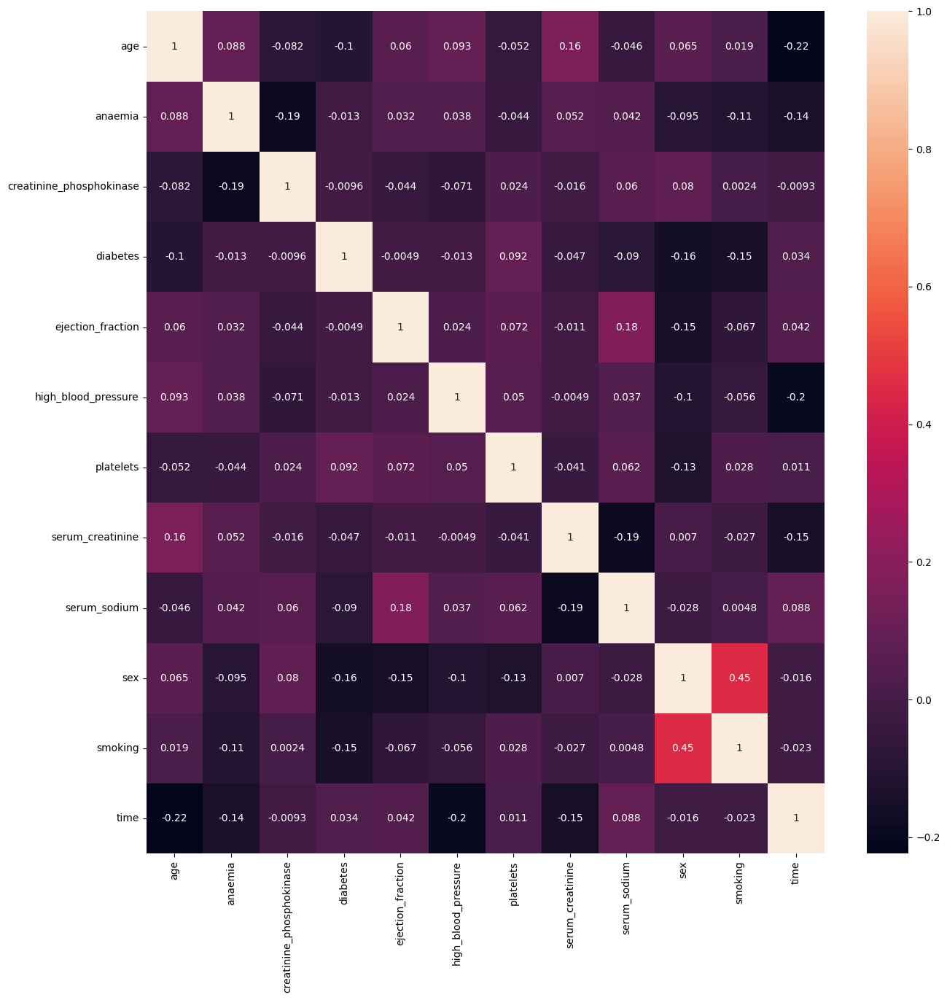

In [ ]:
#This will help us understand how strongly each feature is related to the others
plt.figure(figsize = (15, 15))
sns.heatmap(df.drop(['DEATH_EVENT'], axis = 1).corr(), annot = True)

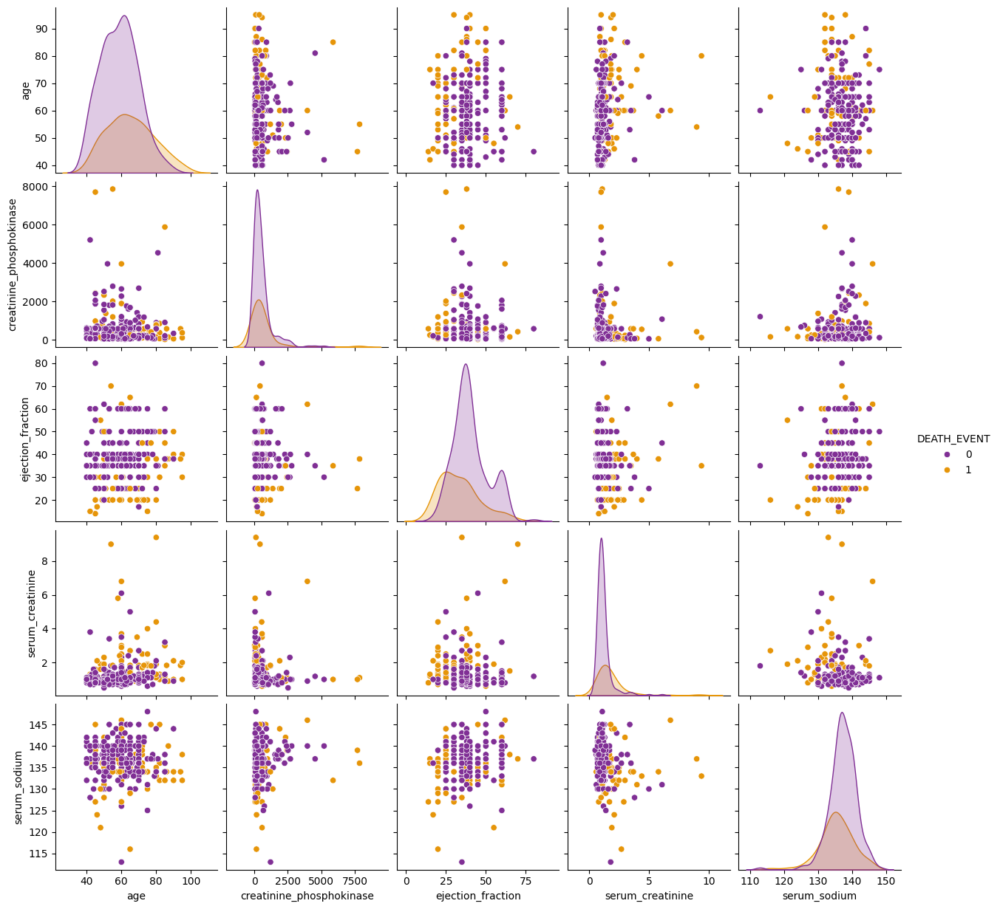

In [ ]:
# This will helps us to visualizing relationships between features in a dataset and understanding how they relate to the target variable (DEATH_EVENT).
sns.pairplot(df[['age', 'creatinine_phosphokinase', 'ejection_fraction',
                 'serum_creatinine', 'serum_sodium', 'DEATH_EVENT']],
             hue='DEATH_EVENT', palette='CMRmap')
plt.show()


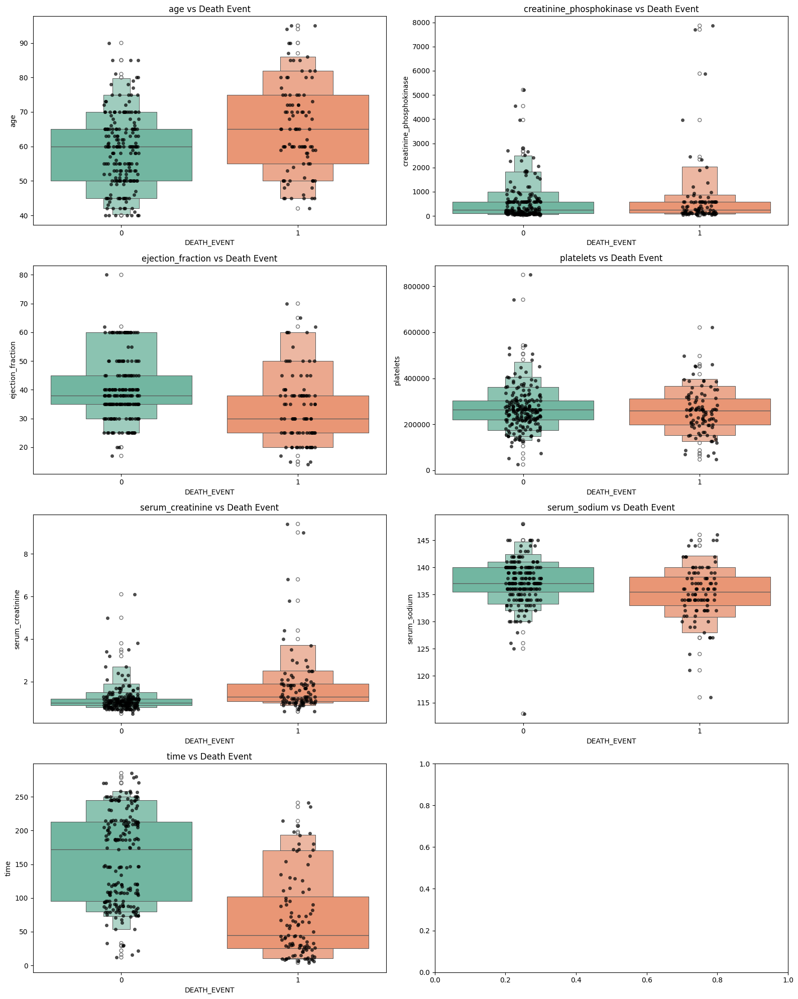

In [ ]:
 # this code helps to show outliers effectively.
# List of features to visualize
features = ["age", "creatinine_phosphokinase", "ejection_fraction",
            "platelets", "serum_creatinine", "serum_sodium", "time"]
fig, axes = plt.subplots(4, 2, figsize=(16, 20))
# Flatten the axes array for easier indexing
axes = axes.flatten()
# Loop over the features and create plots
for i, feature in enumerate(features):
    sns.stripplot(x="DEATH_EVENT", y=feature, data=df, color="black", alpha=0.7, ax=axes[i])
    sns.boxenplot(x="DEATH_EVENT", y=feature, data=df, hue="DEATH_EVENT", palette="Set2", ax=axes[i], legend=False)
    axes[i].set_title(f'{feature} vs Death Event')
plt.tight_layout()
plt.show()


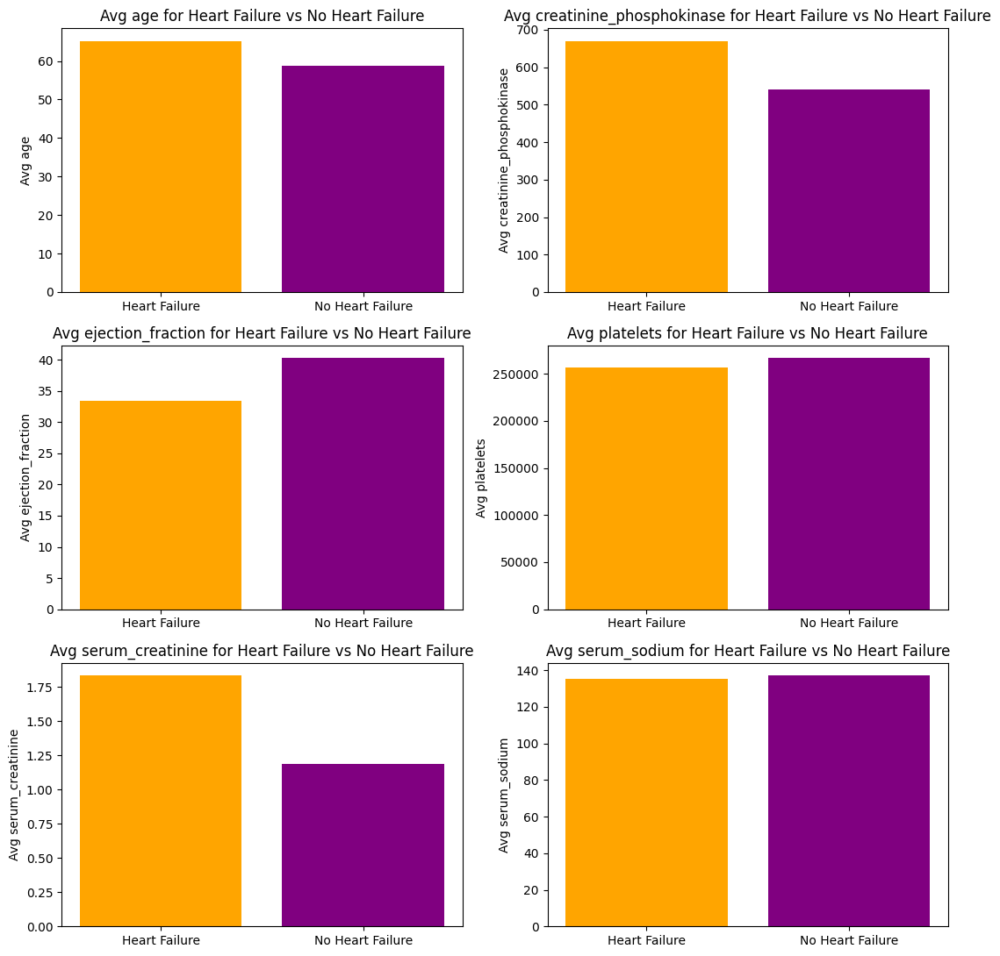

In [ ]:
#This code visualizes the average values of selected continuous features for heart failure and non-heart failure groups using bar charts.
# Separate the data into two groups based on the DEATH_EVENT
heart_failure = df[df['DEATH_EVENT'] == 1]  # People who experienced heart failure (DEATH_EVENT = 1)
no_heart_failure = df[df['DEATH_EVENT'] == 0]  # People who did not experience heart failure (DEATH_EVENT = 0)

# List of features we want to compare
features = ['age', 'creatinine_phosphokinase', 'ejection_fraction',
            'platelets', 'serum_creatinine', 'serum_sodium']

# Create a 3x2 plot layout to display all the features
fig, axes = plt.subplots(3, 2, figsize=(11, 11))

# Loop over the features and create a bar chart for each one
for i, feature in enumerate(features):
    row = i // 2  # Determine the row for the subplot
    col = i % 2  # Determine the column for the subplot

    # Calculate the average values for the heart failure and no heart failure groups
    avg_heart_failure = heart_failure[feature].mean()
    avg_no_heart_failure = no_heart_failure[feature].mean()

    # Create a bar chart to compare the average values
    ax = axes[row, col]
    ax.bar(['Heart Failure', 'No Heart Failure'], [avg_heart_failure, avg_no_heart_failure], color=['orange', 'purple'])
    ax.set_ylabel(f"Avg {feature}")
    ax.set_title(f"Avg {feature} for Heart Failure vs No Heart Failure")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


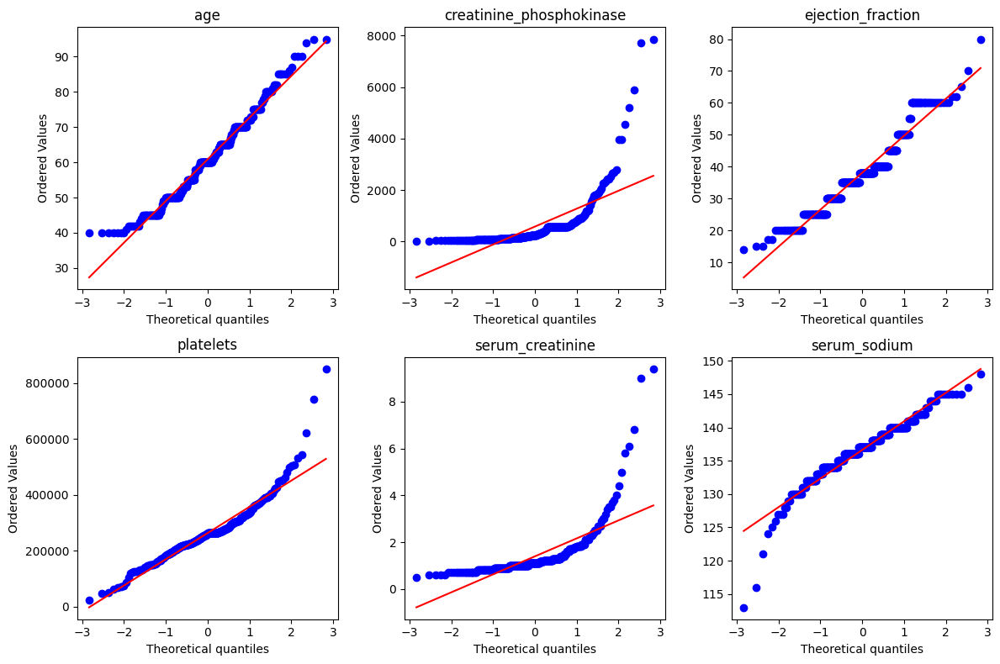

In [ ]:
#This code is used to generate Q-Q (Quantile-Quantile) plots for several continuous features in a dataset to test for normality.
continuous_feature_names = ['age', 'creatinine_phosphokinase', 'ejection_fraction', 'platelets',
                            'serum_creatinine', 'serum_sodium']

# Create the subplots grid (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
# Loop through each continuous feature and generate Q-Q plot
for i, feature in enumerate(continuous_feature_names):
    ax = axes[i // 3, i % 3]  # Get the current subplot position
    stats.probplot(df[feature], plot=ax)  # Generate Q-Q plot
    ax.set_title(feature)  # Set the title as the feature name

plt.tight_layout()
plt.show()



### **Normalize continuous variables**


In [ ]:
# List of all continuous variables
continuous_vars = ['age', 'creatinine_phosphokinase', 'ejection_fraction', 'platelets',
                   'serum_creatinine', 'serum_sodium', 'time']
# Normalize the continuous variables
scaler = StandardScaler()
df[continuous_vars] = scaler.fit_transform(df[continuous_vars])
df[continuous_vars]

,age,creatinine_phosphokinase,ejection_fraction,platelets,serum_creatinine,serum_sodium,time
0,1.192945,0.000166,-1.530560,1.681648e-02,0.490057,-1.504036,-1.629502
1,-0.491279,7.514640,-0.007077,7.535660e-09,-0.284552,-0.141976,-1.603691
2,0.350833,-0.449939,-1.530560,-1.038073e+00,-0.090900,-1.731046,-1.590785
3,-0.912335,-0.486071,-1.530560,-5.464741e-01,0.490057,0.085034,-1.590785
4,0.350833,-0.435486,-1.530560,6.517986e-01,1.264666,-4.682176,-1.577879
...,...,...,...,...,...,...,...
294,0.098199,-0.537688,-0.007077,-1.109765e+00,-0.284552,1.447094,1.803451
295,-0.491279,1.278215,-0.007077,6.802472e-02,-0.187726,0.539054,1.816357
296,-1.333392,1.525979,1.854958,4.902082e+00,-0.575031,0.312044,1.906697
297,-1.333392,1.890398,-0.007077,-1.263389e+00,0.005926,0.766064,1.932509


### **Split the dataset**


In [ ]:
# Define features (x) and target (y)
x = df.iloc[:, :-1].values  # All columns except the last one (DEATH_EVENT)
y = df.iloc[:, -1].values   # The last column (DEATH_EVENT)

# Check class distribution before SMOTE
counter_before = Counter(y)
print(f'Class distribution before SMOTE: {counter_before}')

# Apply SMOTE to balance the classes in DEATH_EVENT
oversample = SMOTE()
x, y = oversample.fit_resample(x, y)

# Check class distribution after SMOTE
counter_after = Counter(y)
print(f'Class distribution after SMOTE: {counter_after}')

# Split the data into training (70%) and temporary (30%)
x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.30, random_state=42)

# Further split the temporary set into validation (15%) and test (15%)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.50, random_state=42)

# Print the shapes of the datasets
print(f"Training set shape: {x_train.shape}")
print(f"Validation set shape: {x_val.shape}")
print(f"Test set shape: {x_test.shape}")

Class distribution before SMOTE: Counter({0: 203, 1: 96})
Class distribution after SMOTE: Counter({1: 203, 0: 203})
Training set shape: (284, 12)
Validation set shape: (61, 12)
Test set shape: (61, 12)


## **Model Development and Evaluation**

#### **Logistic Regression Model**

Accuracy: 0.89
Precision: 0.89
Recall: 0.86
F1 Score: 0.87


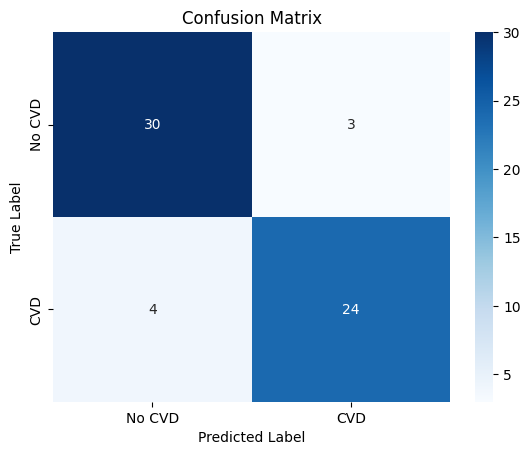

In [ ]:
# Train Logistic Regression Model
logreg = LogisticRegression(max_iter=1000)
logreg.fit(x_train, y_train)

# Make predictions
y_pred = logreg.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualize Confusion Matrix
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No CVD', 'CVD'],
            yticklabels=['No CVD', 'CVD'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


#### **SVM**

SVM (Linear Kernel) - Accuracy: 0.85, Precision: 0.85, Recall: 0.82, F1 Score: 0.84


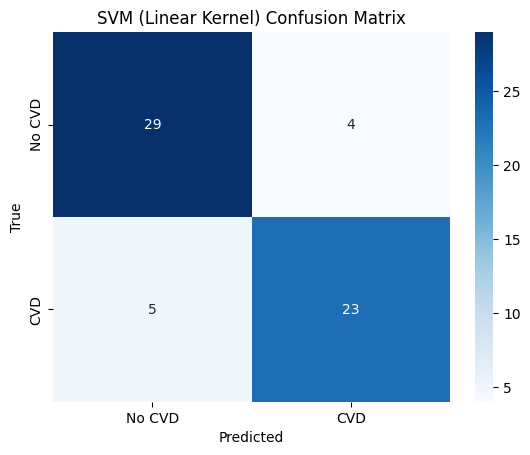

SVM (RBF Kernel) - Accuracy: 0.89, Precision: 0.84, Recall: 0.93, F1 Score: 0.88


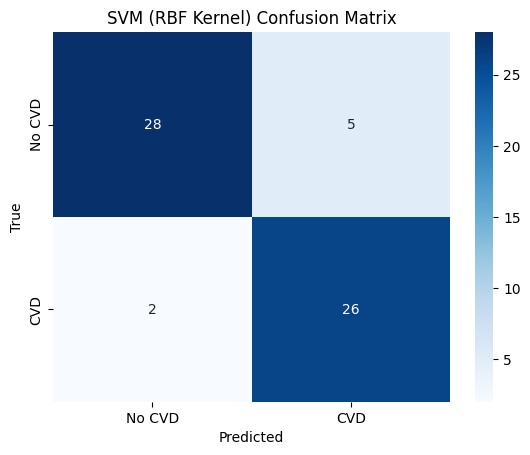

In [ ]:
# Function to evaluate model and print results
def evaluate_model(model, model_name):
    model.fit(x_train, y_train)  # Train model
    y_pred = model.predict(x_test)  # Make predictions

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    # Print results
    print(f'{model_name} - Accuracy: {accuracy:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}, F1 Score: {f1:.2f}')

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No CVD', 'CVD'], yticklabels=['No CVD', 'CVD'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

# Evaluate SVM models
svm_linear = SVC(kernel='linear')
evaluate_model(svm_linear, 'SVM (Linear Kernel)')

svm_rbf = SVC(kernel='rbf')
evaluate_model(svm_rbf, 'SVM (RBF Kernel)')

#### **Random Forest Model**

Accuracy: 0.95
Precision: 0.93
Recall: 0.96
F1 Score: 0.95


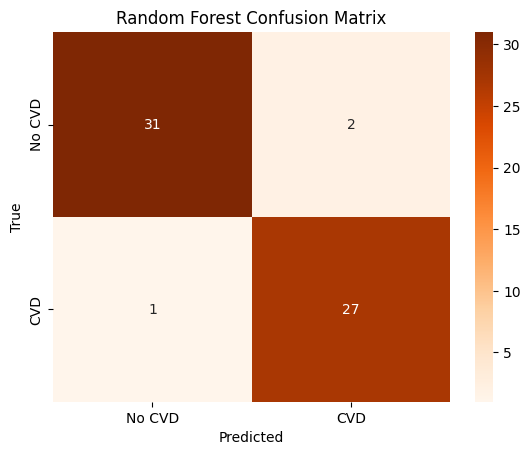

In [ ]:
# Train a Random Forest Model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(x_train, y_train)

# Make predictions on the test set
y_pred_rf = rf_model.predict(x_test)

# Evaluate the model
accuracy_rf = accuracy_score(y_test, y_pred_rf)
precision_rf = precision_score(y_test, y_pred_rf)
recall_rf = recall_score(y_test, y_pred_rf)
f1_rf = f1_score(y_test, y_pred_rf)

# Print evaluation metrics
print(f'Accuracy: {accuracy_rf:.2f}')
print(f'Precision: {precision_rf:.2f}')
print(f'Recall: {recall_rf:.2f}')
print(f'F1 Score: {f1_rf:.2f}')

# Confusion Matrix
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)

# Visualize the Confusion Matrix
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['No CVD', 'CVD'], yticklabels=['No CVD', 'CVD'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Random Forest Confusion Matrix')
plt.show()

#### **Fully Connected Neural Network with different parameter fine tuning**

In [ ]:
def create_fcnn_model(input_shape, learning_rate, dropout_rate):
    model = models.Sequential()
    model.add(layers.Input(shape=(input_shape,)))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(32, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(1, activation='sigmoid'))

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model

# Parameter grid to search over
param_grid_fcnn = {
    'learning_rate': [0.01, 1e-3, 5e-4, 1e-4],  # Tunable learning rates
    'dropout_rate': [0.3, 0.5, 0.7],  # Dropout rates
    'batch_size': [32, 64],  # Various batch sizes
    'epochs': [50, 100]  # Number of epochs
}

# Generate all combinations of the parameters
param_combinations = list(itertools.product(param_grid_fcnn['learning_rate'],
                                            param_grid_fcnn['dropout_rate'],
                                            param_grid_fcnn['batch_size'],
                                            param_grid_fcnn['epochs']))

# To store the results
best_accuracy = 0
best_params = None

# Loop over all combinations of hyperparameters
for lr, dropout_rate, batch_size, epochs in param_combinations:
    print(f"\nTraining with parameters: learning_rate={lr}, dropout_rate={dropout_rate}, batch_size={batch_size}, epochs={epochs}")

    # Create the model with the current set of parameters
    input_shape = x_train.shape[1]
    fcnn_model = create_fcnn_model(input_shape, lr, dropout_rate)

    # Train the model
    fcnn_model.fit(x_train, y_train, validation_data=(x_val, y_val),
                   epochs=epochs, batch_size=batch_size, verbose=0)

    # Predict on the test set
    y_pred_fcnn = (fcnn_model.predict(x_test) > 0.5).astype("int32")  # Binarize predictions (threshold = 0.5)

    # Calculate evaluation metrics
    accuracy_fcnn = accuracy_score(y_test, y_pred_fcnn)
    precision_fcnn = precision_score(y_test, y_pred_fcnn)
    recall_fcnn = recall_score(y_test, y_pred_fcnn)
    f1_fcnn = f1_score(y_test, y_pred_fcnn)

    # Print the results for this combination
    print(f"Accuracy: {accuracy_fcnn:.2f}, Precision: {precision_fcnn:.2f}, Recall: {recall_fcnn:.2f}, F1 Score: {f1_fcnn:.2f}")

    # Update the best model if necessary
    if accuracy_fcnn > best_accuracy:
        best_accuracy = accuracy_fcnn
        best_params = {'learning_rate': lr, 'dropout_rate': dropout_rate, 'batch_size': batch_size, 'epochs': epochs}
        print(f"New best model found with accuracy: {best_accuracy:.2f}")

# Print the best hyperparameters
print(f"\nBest Hyperparameters: {best_params}")
print(f"Best Accuracy: {best_accuracy:.2f}")



Training with parameters: learning_rate=0.01, dropout_rate=0.3, batch_size=32, epochs=50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Accuracy: 0.93, Precision: 0.88, Recall: 1.00, F1 Score: 0.93
New best model found with accuracy: 0.93

Training with parameters: learning_rate=0.01, dropout_rate=0.3, batch_size=32, epochs=100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Accuracy: 0.92, Precision: 0.85, Recall: 1.00, F1 Score: 0.92

Training with parameters: learning_rate=0.01, dropout_rate=0.3, batch_size=64, epochs=50


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Accuracy: 0.93, Precision: 0.96, Recall: 0.89, F1 Score: 0.93

Training with parameters: learning_rate=0.01, dropout_rate=0.3, batch_size=64, epochs=100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Accuracy: 0.87, Precision: 0.78, Recall: 1.00, F1 Score: 0.88

Training with parameters: learning_rate=0.01, dropout_rate=0.5, batch_size=32, epochs=50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
Accuracy: 0.92, Precision: 0.85, Recall: 1.00, F1 Score: 0.92

Training with parameters: learning_rate=0.01, dropout_rate=0.5, batch_size=32, epochs=100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Accuracy: 0.90, Precision: 0.82, Recall: 1.00, F1 Score: 0.90

Training with parameters: learning_rate=0.01, dropout_rate=0.5, batch_size=64, epochs=50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Accuracy: 0.95, Precision: 0.90, Recall: 1.00, F1 Score: 0.95
New best model found with accuracy: 0.95

Training with parameters: learning_rate=0.01, dropout_rate=0.5, batch_size=64, epochs=100
2/2 ━

#### **Convolutional Neural Network (CNN)**

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 12, 32)              │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_96               │ (None, 12, 32)              │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 12, 64)              │           6,208 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_97               │ (None, 12, 64)              │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_2 (Conv1D)                    │ (None, 12, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_98               │ (None, 12, 128)             │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 6, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_96 (Dropout)                 │ (None, 6, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_144 (Dense)                    │ (None, 256)                 │         196,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_99               │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_145 (Dense)                    │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_100              │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_146 (Dense)                    │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 363,969 (1.39 MB)

 Trainable params: 361,985 (1.38 MB)

 Non-trainable params: 1,984 (7.75 KB)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.5848 - loss: 0.8246 - val_accuracy: 0.5410 - val_loss: 0.6842
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7968 - loss: 0.4908 - val_accuracy: 0.5574 - val_loss: 0.6398
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.7872 - loss: 0.5130 - val_accuracy: 0.6066 - val_loss: 0.6367
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.8296 - loss: 0.4533 - val_accuracy: 0.5410 - val_loss: 0.9187
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.7768 - loss: 0.5726 - val_accuracy: 0.5738 - val_loss: 0.7489
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.8437 - loss: 0.4028 - val_accuracy: 0.7705 - val_loss: 0.5544
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.8298 - loss: 0.4072 - val_accuracy: 0.7377 - val_loss: 0.5401
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8854 - loss: 0.2784 - val_accuracy: 0.7705 - v

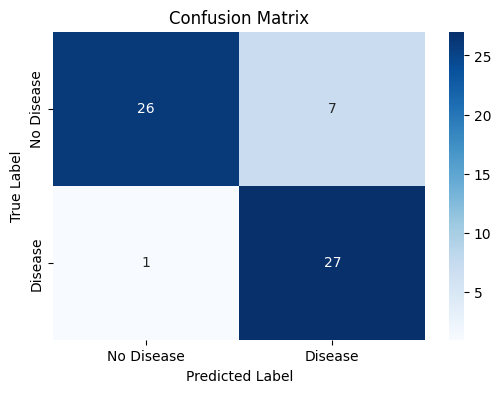

In [ ]:
# For CNN, reshape to 3D (samples, timesteps, features)
x_train_cnn = np.array(x_train).reshape(x_train.shape[0], x_train.shape[1], 1)
x_test_cnn = np.array(x_test).reshape(x_test.shape[0], x_test.shape[1], 1)

# Define the CNN model
cnn_model = tf.keras.models.Sequential()

# Add Conv1D layers with LeakyReLU activation and BatchNormalization
cnn_model.add(Conv1D(filters=32, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001), input_shape=(x_train_cnn.shape[1], 1)))
cnn_model.add(BatchNormalization())  # Batch Normalization

cnn_model.add(Conv1D(filters=64, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
cnn_model.add(BatchNormalization())  # Batch Normalization

cnn_model.add(Conv1D(filters=128, kernel_size=(3,), padding='same', activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
cnn_model.add(BatchNormalization())  # Batch Normalization

# Add pooling, dropout, and flatten layer
cnn_model.add(MaxPool1D(pool_size=(3,), strides=2, padding='same'))
cnn_model.add(Dropout(0.5))
cnn_model.add(Flatten())

# Add dense layers with LeakyReLU activation and BatchNormalization
cnn_model.add(Dense(units=256, activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
cnn_model.add(BatchNormalization())  # Batch Normalization

cnn_model.add(Dense(units=512, activation=tf.keras.layers.LeakyReLU(alpha=0.001)))
cnn_model.add(BatchNormalization())  # Batch Normalization

# Final output layer for binary classification
cnn_model.add(Dense(units=1, activation='sigmoid'))  # Sigmoid activation for binary classification

# Compile the model
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
cnn_model.summary()

# Train the model using 3D reshaped data for CNN
cnn_model_history = cnn_model.fit(x_train_cnn, y_train, epochs=50, batch_size=10, validation_data=(x_test_cnn, y_test))

# Evaluate the CNN model on the test data
y_pred_prob = cnn_model.predict(x_test_cnn)
y_pred = (y_pred_prob > 0.5).astype("int32")  # Convert probabilities to binary predictions

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation results
print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualize the Confusion Matrix using a heatmap
plt.figure(figsize=(6,4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Disease', 'Disease'], yticklabels=['No Disease', 'Disease'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


## **Explainable AI**

#### **Logistic Regression with SHAP**

  0%|          | 0/61 [00:00<?, ?it/s]

SHAP values shape: (61, 12)


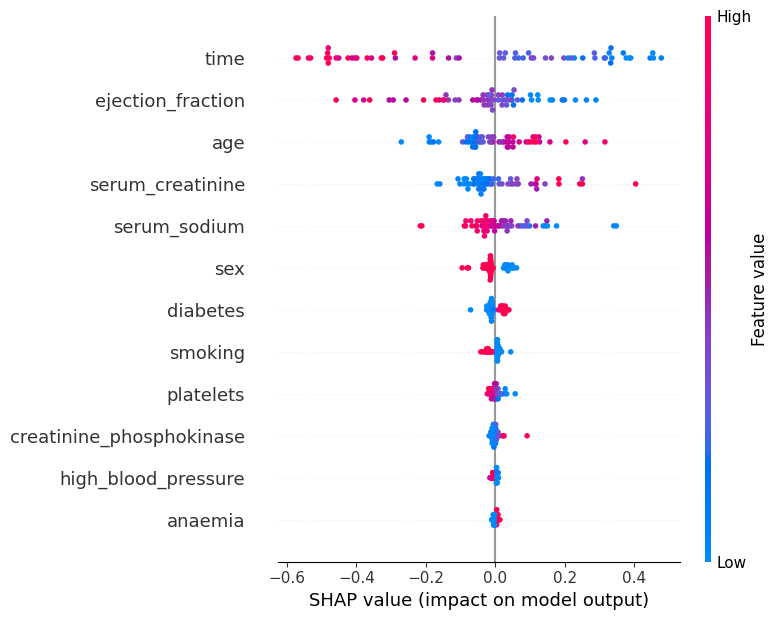

In [ ]:
# Train Logistic Regression Model
logreg = LogisticRegression(max_iter=1000)
logreg.fit(x_train, y_train)

# Use SHAP KernelExplainer for Logistic Regression
explainer = shap.KernelExplainer(logreg.predict, x_train)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(x_test)

# Check the shape of SHAP values
print(f"SHAP values shape: {np.array(shap_values).shape}")

# Generate SHAP summary plot for all features
shap.summary_plot(shap_values, x_test, feature_names=df.columns[:-1])


### **Logistic Regression with Lime**

In [ ]:
# Train Logistic Regression Model (already trained above)
logreg.fit(x_train, y_train)

# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(x_train, feature_names=df.columns[:-1], class_names=['No CVD', 'CVD'], discretize_continuous=True)

# Choose a sample from the test set to explain
i = 0  # You can choose any sample from the test set
sample = x_test[i].reshape(1, -1)

# Generate LIME explanation for this sample
lime_explanation = lime_explainer.explain_instance(sample[0], logreg.predict_proba, num_features=10)

# Show the explanation
lime_explanation.show_in_notebook()  # For notebooks, or you can use lime_explanation.as_html() for an HTML page


### **SVM with SHARP**

  0%|          | 0/61 [00:00<?, ?it/s]

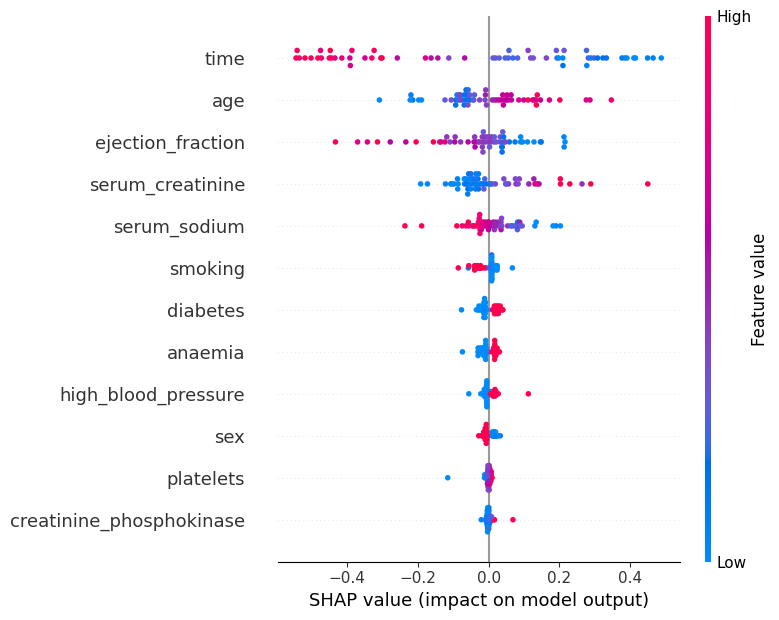

  0%|          | 0/61 [00:00<?, ?it/s]

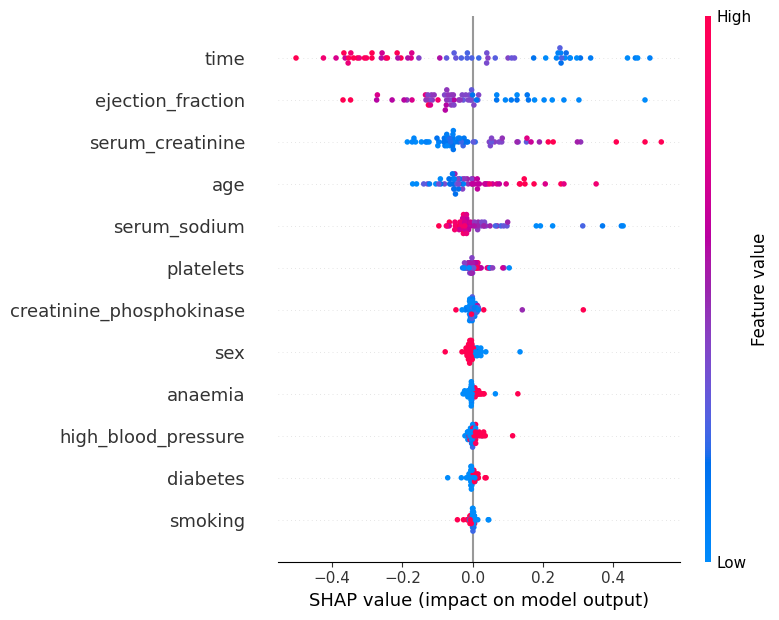

In [ ]:
def explain_model_with_shap(model, model_name):
    # Explain the model with SHAP (KernelExplainer for non-deep learning models)
    shap_explainer = shap.KernelExplainer(model.predict, x_train)
    shap_values = shap_explainer.shap_values(x_test)

    # SHAP summary plot (global feature importance)
    shap.summary_plot(shap_values, x_test, feature_names=df.columns[:-1])

# Show SHAP explanations for trained models

# For the Linear SVM
explain_model_with_shap(svm_linear, 'SVM (Linear Kernel)')

# For the RBF SVM
explain_model_with_shap(svm_rbf, 'SVM (RBF Kernel)')


### **SVM with Lime**

In [ ]:
# Correct SVM model initialization with probability=True
svm_linear = SVC(kernel='linear', probability=True)  # Enable probability estimates
svm_rbf = SVC(kernel='rbf', probability=True)  # Enable probability estimates

# Train the models (assuming x_train and y_train are already defined and preprocessed)
svm_linear.fit(x_train, y_train)
svm_rbf.fit(x_train, y_train)

# Function to evaluate and explain using LIME
def evaluate_model_with_lime(model, model_name):
    # Make predictions
    y_pred = model.predict(x_test)

    # Explain a specific instance using LIME (local explanation)
    lime_explainer = lime.lime_tabular.LimeTabularExplainer(x_train, feature_names=df.columns[:-1], class_names=['No CVD', 'CVD'], discretize_continuous=True)

    # Pick a specific instance to explain
    i = 0  # You can choose any index (e.g., i = 0 for the first instance)
    lime_explanation = lime_explainer.explain_instance(x_test[i], model.predict_proba)

    # Show LIME explanation
    lime_explanation.show_in_notebook()  # Use this in a Jupyter Notebook

# Run LIME explanations for the trained models

# For the Linear SVM
evaluate_model_with_lime(svm_linear, 'SVM (Linear Kernel)')

# For the RBF SVM
evaluate_model_with_lime(svm_rbf, 'SVM (RBF Kernel)')


### **Random Forest with SHARP**

  0%|          | 0/61 [00:00<?, ?it/s]

SHAP values shape: (61, 12)


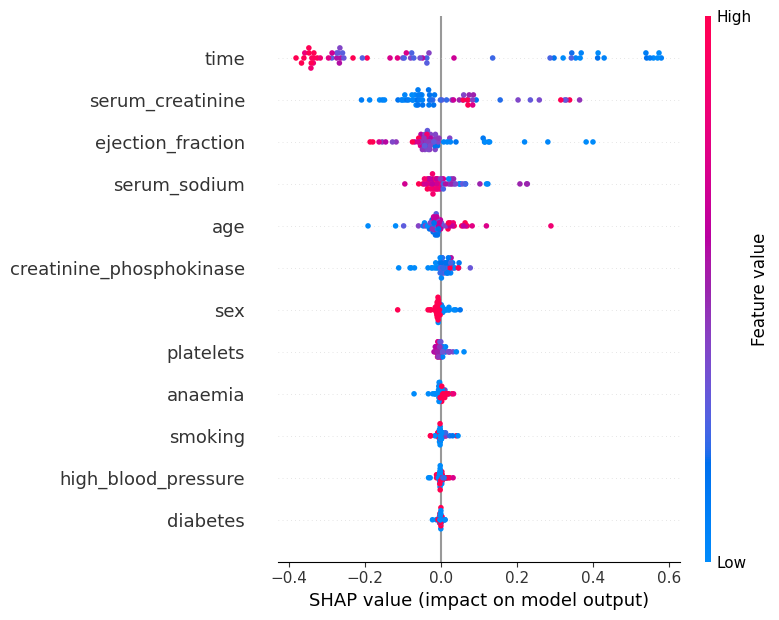

In [41]:
# Ensure the Random Forest model is trained
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(x_train, y_train)

# Use SHAP KernelExplainer for Random Forest (this may be slow)
explainer = shap.KernelExplainer(rf_model.predict, x_train)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(x_test)

# Check the shape of SHAP values
print(f"SHAP values shape: {np.array(shap_values).shape}")

# Generate SHAP summary plot for all features
shap.summary_plot(shap_values, x_test, feature_names=df.columns[:-1])

### **Random Forest with Lime**

In [43]:
# Train Random Forest Model
rf_model.fit(x_train, y_train)

# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    x_train, feature_names=df.columns[:-1], class_names=['No CVD', 'CVD'], discretize_continuous=True)

# Choose a sample from the test set to explain
i = 0  # You can choose any sample from the test set
sample = x_test[i].reshape(1, -1)

# Generate LIME explanation for this sample
lime_explanation = lime_explainer.explain_instance(sample[0], rf_model.predict_proba, num_features=10)

# Show the explanation
lime_explanation.show_in_notebook()  # For notebooks, or you can use lime_explanation.as_html() for an HTML page


### **FCNN with SHARP**

PermutationExplainer explainer: 62it [00:21,  2.14it/s]


SHAP values shape: (61, 12)


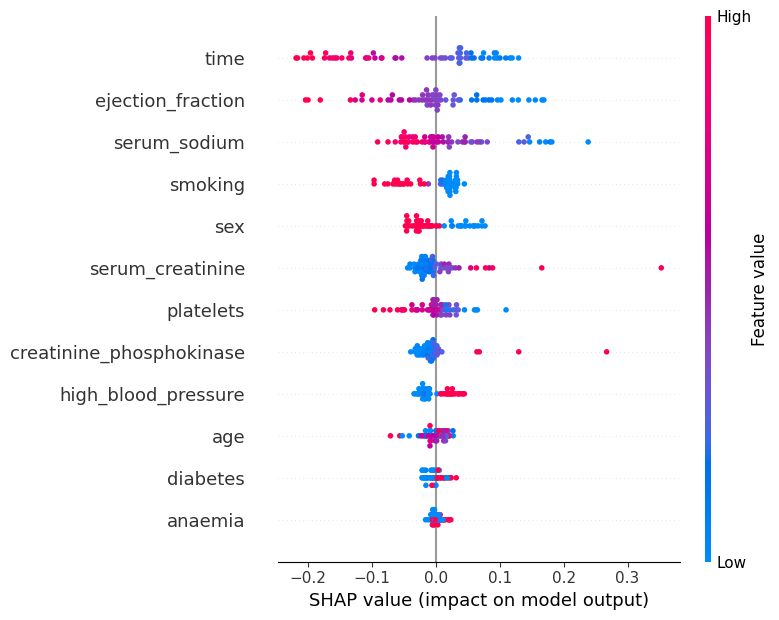

In [44]:
# Use the unified Explainer API from SHAP
explainer = shap.Explainer(fcnn_model, x_train)  # Automatically selects the appropriate explainer

# Calculate SHAP values for the test set
shap_values = explainer(x_test)

# Check the shape of SHAP values
print(f"SHAP values shape: {shap_values.values.shape}")  # Expected shape: (61, 12)

# Generate SHAP summary plot for all features
shap.summary_plot(shap_values, x_test, feature_names=df.columns[:-1])



### **FCNN with Lime**

In [48]:
# Custom function to return both class probabilities
def predict_proba_binary(model, X):
    prob_class_1 = model.predict(X)  # Probabilities for class 1 (CVD)
    prob_class_0 = 1 - prob_class_1   # Probabilities for class 0 (No CVD)
    return np.hstack((prob_class_0, prob_class_1))  # Combine into a (num_samples, 2) array

# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    x_train, feature_names=df.columns[:-1], class_names=['No CVD', 'CVD'], discretize_continuous=True)

# Choose a sample from the test set to explain
i = 0  # You can choose any sample from the test set
sample = x_test[i].reshape(1, -1)

# Generate LIME explanation for this sample using the custom predict_proba_binary function
lime_explanation = lime_explainer.explain_instance(
    sample[0], lambda x: predict_proba_binary(fcnn_model, x), num_features=10)

# Show the explanation
lime_explanation.show_in_notebook()  # For notebooks, or you can use lime_explanation.as_html() for an HTML page


157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
